## Importing Libarires

In [3]:
!pip install ipython-autotime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.6 MB/s eta 0:00:00


In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
import re
from tqdm import tqdm
import pandas as pd
import seaborn as sns
import pathlib
import random
import tensorflow as tf
%load_ext autotime

time: 316 µs (started: 2024-04-10 10:08:02 +00:00)


## Demographics Data for MRI patients

#### Loading and Formatting Demographics Data

In [5]:
#Getting data directly from the source (OASIS Brain Data)
df = pd.read_excel('https://www.oasis-brains.org/files/oasis_longitudinal_demographics.xlsx')

time: 1.47 s (started: 2024-04-10 10:08:07 +00:00)


In [11]:
#Mapping the values of Demented (CDR) into different categories.
group_mapping = {
    0.0: 'Non Demented',
    0.5: 'Mild Demented',
    1.0: 'Moderate Demented',
    2.0: 'Highly Demented'
}

df['Actual Group'] = df['CDR'].map(group_mapping)

df_demographics_input = df
df.head()

,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF,Actual Group
0,OAS2_0001,OAS2_0001_MR1,Nondemented,1,0,M,R,87,14,2.0,27.0,0.0,1986.550000,0.696106,0.883440,Non Demented
1,OAS2_0001,OAS2_0001_MR2,Nondemented,2,457,M,R,88,14,2.0,30.0,0.0,2004.479526,0.681062,0.875539,Non Demented
2,OAS2_0002,OAS2_0002_MR1,Demented,1,0,M,R,75,12,NaN,23.0,0.5,1678.290000,0.736336,1.045710,Mild Demented
3,OAS2_0002,OAS2_0002_MR2,Demented,2,560,M,R,76,12,NaN,28.0,0.5,1737.620000,0.713402,1.010000,Mild Demented
4,OAS2_0002,OAS2_0002_MR3,Demented,3,1895,M,R,80,12,NaN,22.0,0.5,1697.911134,0.701236,1.033623,Mild Demented


time: 96.7 ms (started: 2024-04-10 10:21:01 +00:00)


#### Analysis and Visulization of Demographics Data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 373 entries, 0 to 372

Data columns (total 16 columns):

 #   Column        Non-Null Count  Dtype  

---  ------        --------------  -----  

 0   Subject ID    373 non-null    object 

 1   MRI ID        373 non-null    object 

 2   Group         373 non-null    object 

 3   Visit         373 non-null    int64  

 4   MR Delay      373 non-null    int64  

 5   M/F           373 non-null    object 

 6   Hand          373 non-null    object 

 7   Age           373 non-null    int64  

 8   EDUC          373 non-null    int64  

 9   SES           354 non-null    float64

 10  MMSE          371 non-null    float64

 11  CDR           373 non-null    float64

 12  eTIV          373 non-null    float64

 13  nWBV          373 non-null    float64

 14  ASF           373 non-null    float64

 15  Actual Group  373 non-null    object 

dtypes: float64(6), int64(4), object(6)

memory usage: 46.8+ KB

time: 19 ms (started: 2024-04-09 17

In [ ]:
df.describe()

,Visit,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
count,373.000000,373.000000,373.000000,373.000000,354.000000,371.000000,373.000000,373.000000,373.000000,373.000000
mean,1.882038,595.104558,77.013405,14.597855,2.460452,27.342318,0.290885,1488.121584,0.729556,1.195460
std,0.922843,635.485118,7.640957,2.876339,1.134005,3.683244,0.374557,176.135956,0.037141,0.138105
min,1.000000,0.000000,60.000000,6.000000,1.000000,4.000000,0.000000,1105.652499,0.644399,0.875539
25%,1.000000,0.000000,71.000000,12.000000,2.000000,27.000000,0.000000,1357.330000,0.700191,1.098979
50%,2.000000,552.000000,77.000000,15.000000,2.000000,29.000000,0.000000,1470.041312,0.728789,1.193844
75%,2.000000,873.000000,82.000000,16.000000,3.000000,30.000000,0.500000,1596.936793,0.755669,1.292980
max,5.000000,2639.000000,98.000000,23.000000,5.000000,30.000000,2.000000,2004.479526,0.836842,1.587298


time: 40.3 ms (started: 2024-04-09 17:49:00 +00:00)


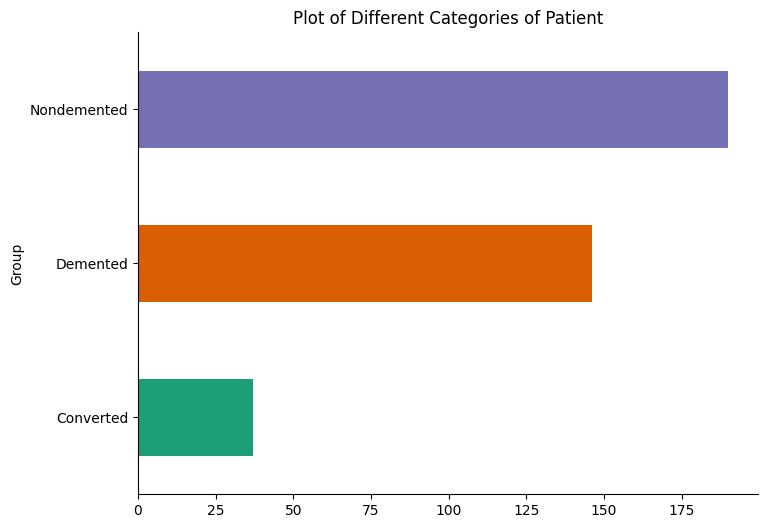

time: 241 ms (started: 2024-04-09 17:54:15 +00:00)


In [ ]:
def plot_barh(df, group_column, plot_title):
    grouped_df = df.groupby(group_column).size()
    plt.figure(figsize=(8, 6))
    grouped_df.plot(kind='barh', color=sns.color_palette('Dark2'))
    plt.gca().spines[['top', 'right']].set_visible(False)
    plt.title(plot_title)
    plt.show()
plot_barh(df, 'Group', 'Plot of Different Categories of Patient')

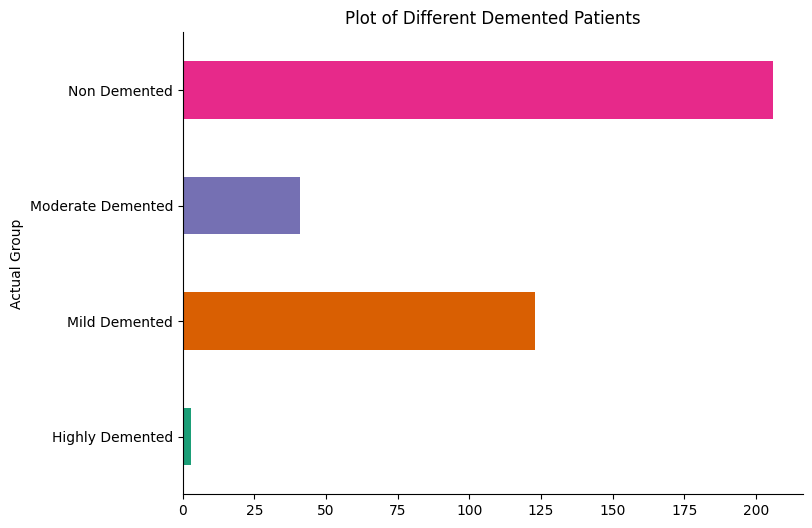

time: 319 ms (started: 2024-04-09 17:54:21 +00:00)


In [ ]:
plot_barh(df, 'Actual Group', 'Plot of Different Demented Patients')

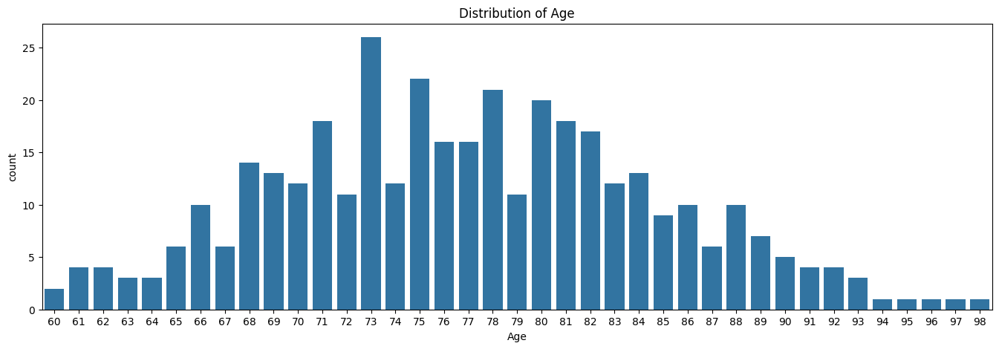

time: 629 ms (started: 2024-04-09 17:54:54 +00:00)


In [ ]:
def plot_countplot(df, x_column, plot_title):
    ax = sns.countplot(x=x_column, data=df)
    ax.figure.set_size_inches(16.5, 5)
    ax.set_title(plot_title)
    plt.show()
plot_countplot(df, 'Age', "Distribution of Age")

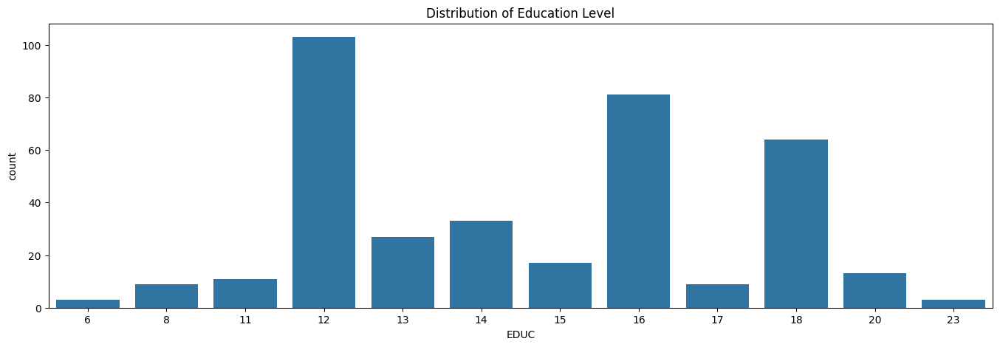

time: 435 ms (started: 2024-04-09 17:55:33 +00:00)


In [ ]:
plot_countplot(df, 'EDUC', "Distribution of Education Level")

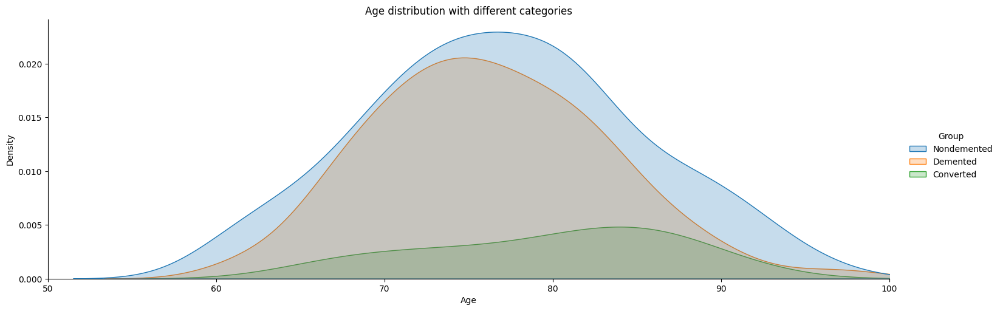

time: 767 ms (started: 2024-04-09 17:59:51 +00:00)


In [ ]:
def plot_distribution(df, hue_column, x_column, plot_title):
    sns.displot(df, x=x_column, hue=hue_column, kind="kde", fill=True, aspect=3)
    plt.title(plot_title)
    plt.show()
plot_distribution(df, "Group", "Age", "Age distribution with different categories")

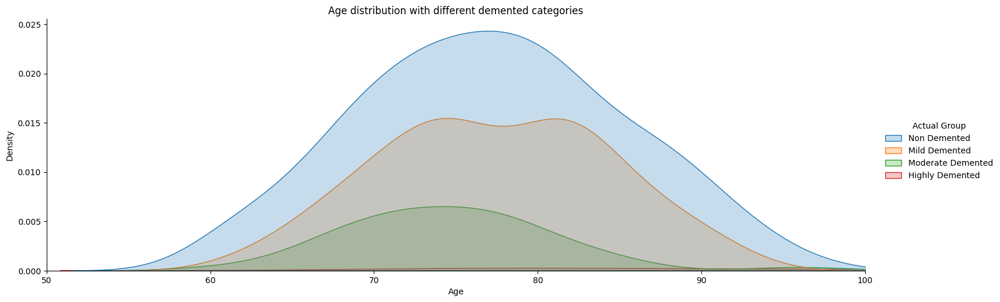

time: 519 ms (started: 2024-04-09 17:59:57 +00:00)


In [ ]:
plot_distribution(df, "Actual Group", "Age", "Age distribution with different demented categories")

## MRI SCANS DATA

#### Downloading Data directly from the OASIS website

In [6]:
path = os.getcwd()

'/content'

time: 7.57 ms (started: 2024-04-10 10:08:20 +00:00)


In [7]:
!wget https://download.nrg.wustl.edu/data/OAS2_RAW_PART1.tar.gz

--2024-04-10 10:08:37--  https://download.nrg.wustl.edu/data/OAS2_RAW_PART1.tar.gz
Resolving download.nrg.wustl.edu (download.nrg.wustl.edu)... 128.252.217.126
Connecting to download.nrg.wustl.edu (download.nrg.wustl.edu)|128.252.217.126|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10874461059 (10G) [application/x-gzip]
Saving to: ‘OAS2_RAW_PART1.tar.gz’

OAS2_RAW_PART1.tar. 100%[===================>]  10.13G  46.3MB/s    in 3m 49s  

2024-04-10 10:12:26 (45.4 MB/s) - ‘OAS2_RAW_PART1.tar.gz’ saved [10874461059/10874461059]

time: 3min 49s (started: 2024-04-10 10:08:37 +00:00)


In [8]:
#unzipping
!tar -xf /content/OAS2_RAW_PART1.tar.gz

time: 5min 18s (started: 2024-04-10 10:15:17 +00:00)


In [ ]:
!rm /content/OAS2_RAW_PART1.tar.gz

time: 405 ms (started: 2024-04-09 18:20:18 +00:00)


In [ ]:
!wget https://download.nrg.wustl.edu/data/OAS2_RAW_PART2.tar.gz

--2024-04-09 18:20:20--  https://download.nrg.wustl.edu/data/OAS2_RAW_PART2.tar.gz

Resolving download.nrg.wustl.edu (download.nrg.wustl.edu)... 128.252.217.126

Connecting to download.nrg.wustl.edu (download.nrg.wustl.edu)|128.252.217.126|:443... connected.

HTTP request sent, awaiting response... 200 OK

Length: 8449289603 (7.9G) [application/x-gzip]

Saving to: ‘OAS2_RAW_PART2.tar.gz’



OAS2_RAW_PART2.tar. 100%[===================>]   7.87G  48.1MB/s    in 2m 50s  



2024-04-09 18:23:11 (47.3 MB/s) - ‘OAS2_RAW_PART2.tar.gz’ saved [8449289603/8449289603]



time: 2min 50s (started: 2024-04-09 18:20:20 +00:00)


In [ ]:
!tar -xf /content/OAS2_RAW_PART2.tar.gz

time: 4min 11s (started: 2024-04-09 18:23:30 +00:00)


In [ ]:
!rm /content/OAS2_RAW_PART2.tar.gz

time: 305 ms (started: 2024-04-09 18:28:08 +00:00)


In [ ]:
import shutil
source_dir = os.path.join('OAS2_RAW_PART2')
destination_dir = os.path.join('OAS2_RAW_PART1')

# Get list of files in source directory
files = os.listdir(source_dir)

# Move each file to the destination directory
for file in files:
    source_file_path = os.path.join(source_dir, file)
    destination_file_path = os.path.join(destination_dir, file)
    shutil.move(source_file_path, destination_file_path)

print("Files moved successfully!")

Files moved successfully!

time: 11.5 ms (started: 2024-04-09 18:28:12 +00:00)


In [ ]:
!rm -r /content/OAS2_RAW_PART2

time: 104 ms (started: 2024-04-09 18:28:15 +00:00)


#### Plotting few Nifit files

In [9]:
def plot_images_with_categories(directory, df):
    image_files = [file for file in os.listdir(directory)]

    num_images = min(len(image_files), 6)  # Limit to 6 images or less if there are fewer files

    # Create a subplot based on the number of images
    fig, axes = plt.subplots(nrows=1, ncols=num_images, figsize=(18, 5))

    # Iterate through the image files and plot each rotated image
    for i, img_file in enumerate(image_files[:num_images]):
        img_path = os.path.join(directory, img_file)

        # Extract MRI ID from the parent folder name
        mri_id = os.path.basename(os.path.dirname(directory))

        # Find corresponding row in DataFrame
        matching_row = df[df['MRI ID'] == mri_id]
        if not matching_row.empty:
            # Extract category from 'Actual Group' column
            category = matching_row.iloc[0]['Actual Group']
        else:
            mri_id = img_file[:13]
            matching_row = df[df['MRI ID'] == mri_id]
            if not matching_row.empty:
              category = matching_row.iloc[0]['Actual Group']
            else:
              category = 'Unknown'

        img = nib.load(img_path)
        img_data = img.get_fdata()

        # Rotate the image 90 degrees counterclockwise
        rotated_img_data = np.rot90(img_data)
        # Display the rotated image in the subplot
        axes.flat[i].imshow(rotated_img_data[:, :, img_data.shape[2]//2], cmap='gray')  # Displaying a central slice
        axes.flat[i].set_title(f"{img_file}\nCategory: {category}")
        axes.flat[i].axis('off')

    plt.tight_layout()
    plt.show()

time: 1.72 ms (started: 2024-04-10 10:20:45 +00:00)


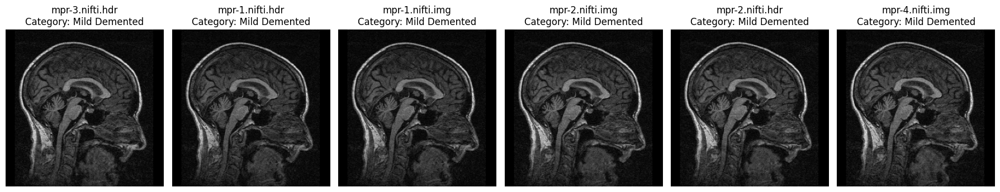

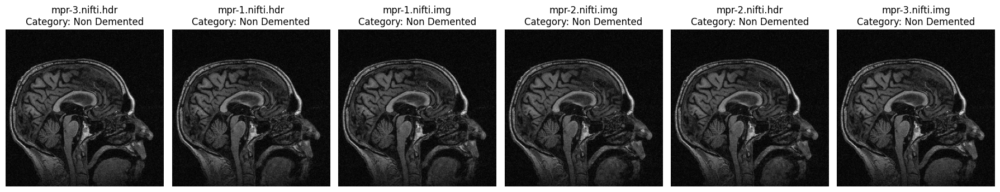

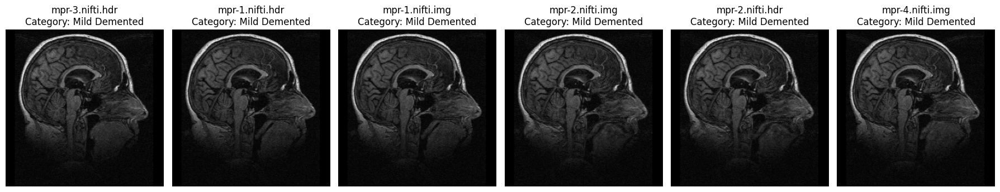

time: 4 s (started: 2024-04-10 10:21:11 +00:00)


In [12]:
path1 = os.path.join('OAS2_RAW_PART1', 'OAS2_0010_MR1', 'RAW')
path2 = os.path.join('OAS2_RAW_PART1', 'OAS2_0001_MR1', 'RAW')
path3 = os.path.join('OAS2_RAW_PART1', 'OAS2_0099_MR1', 'RAW')
plot_images_with_categories(path1, df)
plot_images_with_categories(path2, df)
plot_images_with_categories(path3, df)

#### Formatting the Data into simpler form by removing unnecesssay files, folder and renaming in proper format while reffering to the demographics data.

In [13]:
import shutil
source_directory = os.path.join("OAS2_RAW_PART1")
destination_directory = os.path.join("Data")

# Iterate through each folder in the source directory
for root, dirs, files in os.walk(source_directory):
    for dir_name in dirs:
        # Check if the directory contains a RAW folder
        raw_directory = os.path.join(root, dir_name, "RAW")
        if os.path.exists(raw_directory):
            # Get the new name from the parent folder name
            new_name = os.path.basename(os.path.dirname(raw_directory))

            # Create destination directory if it doesn't exist
            if not os.path.exists(destination_directory):
                os.makedirs(destination_directory)

            # Iterate through each file in the RAW folder
            for filename in os.listdir(raw_directory):
                # Rename and copy image files to the destination directory
                if filename.endswith(".img") or filename.endswith(".hdr"):
                    # Get the file extension
                    file_ext = os.path.splitext(filename)[1]
                    # Construct new filename with nifti included
                    new_filename = f"{new_name}_{filename.split('-')[1].split('.')[0]}.nifti{file_ext}"
                    # Copy and rename the file
                    shutil.copy2(os.path.join(raw_directory, filename), os.path.join(destination_directory, new_filename))
                    # Delete the original file
                    os.remove(os.path.join(raw_directory, filename))

time: 3min 9s (started: 2024-04-10 10:23:25 +00:00)


#### Plotting few files randomly and their categories by matching it with the MRI ID in demographic data.


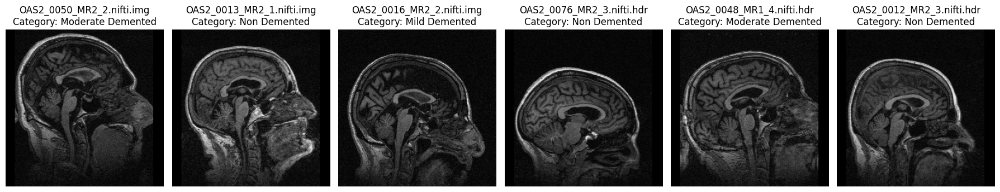

time: 1.58 s (started: 2024-04-10 10:26:45 +00:00)


In [14]:
plot_images_with_categories(destination_directory, df)

#### Formatting the files by putting it in folders respective to their categories while reffering to the demographics data.

In [15]:
data_directory = destination_directory

# Iterate through each file in the data directory
for file_name in os.listdir(data_directory):
    file_path = os.path.join(data_directory, file_name)

    # Extract MRI ID from the first 13 characters of the file name
    mri_id = file_name[:13]

    # Find corresponding row in DataFrame
    matching_row = df[df['MRI ID'] == mri_id]
    if not matching_row.empty:
        # Extract category from 'Actual Group' column
        category = matching_row.iloc[0]['Actual Group']

        # Create category directory if it doesn't exist
        category_directory = os.path.join(data_directory, category)
        if not os.path.exists(category_directory):
            os.makedirs(category_directory)

        # Move the file to the category directory
        new_file_path = os.path.join(category_directory, file_name)
        shutil.move(file_path, new_file_path)

time: 941 ms (started: 2024-04-10 10:26:54 +00:00)


#### Plotting different slices of images to select the final slice values.

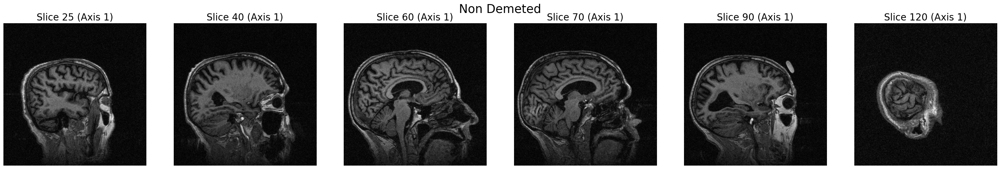

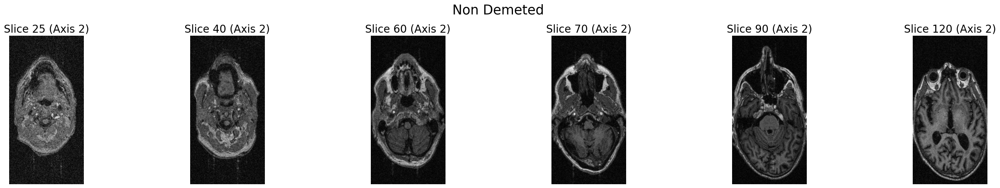

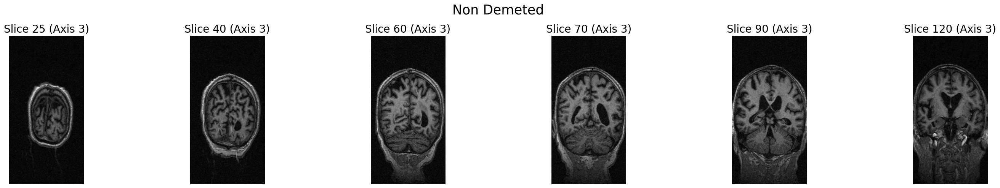

time: 9.21 s (started: 2024-04-10 10:27:53 +00:00)


In [16]:
# Function to process a single NIfTI file
def process_nifti_file(file_path, slice_indices,title, slicing_method):
    img = nib.load(file_path)
    mri_images_data = img.get_fdata()
    # Transpose the data for visualization (adjusted for your array's shape)
    i = np.transpose(mri_images_data, (1, 0, 2, 3))

    # Get the filename without extension
    file_name = os.path.splitext(os.path.basename(file_path))[0]

    # Create the figure and subplots
    fig, axs = plt.subplots(1, len(slice_indices), figsize=(5 * len(slice_indices), 5))

    # Plot each slice
    for idx, slice_idx in enumerate(slice_indices):
        # Extract the slice data based on the specified method
        if slicing_method == 'Axis 1':
            slice_data = i[:, :, slice_idx, 0]
        elif slicing_method == 'Axis 2':
            slice_data = i[slice_idx, :, :, 0]
        elif slicing_method == 'Axis 3':
            slice_data = i[:, slice_idx, :, 0]
        else:
            raise ValueError("Invalid slicing method.")

        # Plot the slice on the corresponding subplot
        axs[idx].imshow(slice_data, origin='lower', cmap='gray')
        axs[idx].set_title(f'Slice {slice_idx} ({slicing_method})', fontsize=20)
        axs[idx].axis('off')

    # Adjust layout
    plt.suptitle(title,fontsize = 25)
    plt.tight_layout()
    plt.show()

# File path
file_path = os.path.join('Data','Non Demented','OAS2_0001_MR1_1.nifti.hdr')

# List of slice indices to extract
slice_indices = [25, 40, 60, 70, 90, 120]

# Slice method options
slicing_methods = ['Axis 1', 'Axis 2', 'Axis 3']

process_nifti_file(file_path, slice_indices, 'Non Demeted', slicing_methods[0])
process_nifti_file(file_path, slice_indices, 'Non Demeted', slicing_methods[1])
process_nifti_file(file_path, slice_indices, 'Non Demeted', slicing_methods[2])

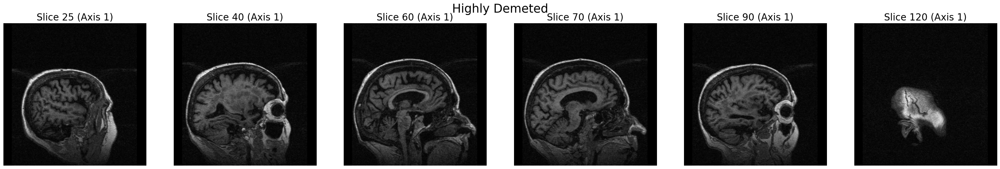

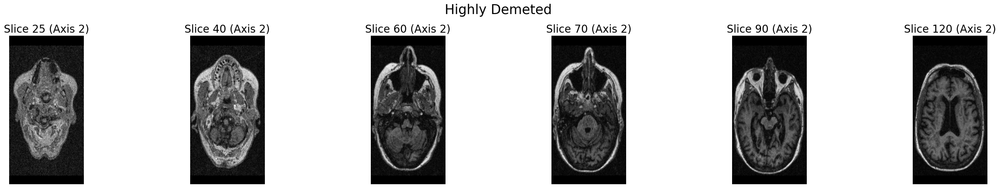

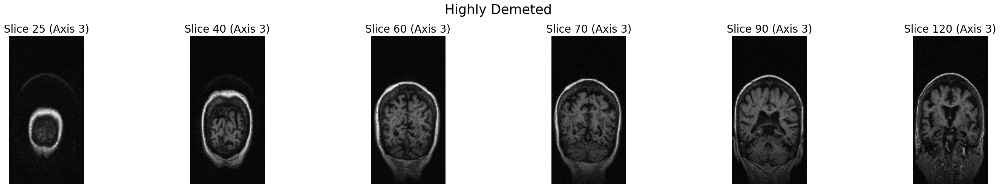

time: 3 s (started: 2024-04-09 19:08:14 +00:00)


In [ ]:
# File path
file_path = os.path.join('Data','Highly Demented','OAS2_0087_MR2_1.nifti.hdr')

# List of slice indices to extract
slice_indices = [25, 40, 60, 70, 90, 120]
process_nifti_file(file_path, slice_indices, 'Highly Demeted', slicing_methods[0])
process_nifti_file(file_path, slice_indices, 'Highly Demeted', slicing_methods[1])
process_nifti_file(file_path, slice_indices, 'Highly Demeted', slicing_methods[2])

#### Plotting different axes of same files with different slices.

#### Saving the final slices and axes for Image Pre-processing and Modelling (This part of code might crash but rerunning it agian will also give the accurate results.)

In [ ]:
# Function to process a single NIfTI file
def process_nifti_file(file_path):
    img = nib.load(file_path)
    mri_images_data = img.get_fdata()

    # Transpose the data for visualization (adjusted for your array's shape)
    i = np.transpose(mri_images_data, (1, 0, 2, 3))

    # Get the filename without extension
    file_name = os.path.splitext(os.path.basename(file_path))[0]

    for idx in slice_indices:
        # Create the figure and plot
        plt.figure(figsize=(15, 5))
        f = i[:, :, idx, 0]

        # Display the slice
        plt.imshow(f, origin='lower')

        # Save the slice as a JPG file

        slice_file_name = f"{file_name}_{idx}.jpg"
        plt.axis('off')
        plt.savefig(os.path.join(os.path.dirname(file_path), slice_file_name), bbox_inches='tight', pad_inches=0)
        plt.close()  # Close the current figure to avoid displaying it

# List of slice indices to extract
slice_indices = [62,64, 66, 68, 70, 72]

# Iterate through each folder and process the files
for root, dirs, files in os.walk(data_directory):
    for file in files:
        if file.endswith(".nifti.hdr"):
            file_path = os.path.join(root, file)
            process_nifti_file(file_path)
            # Delete the original NIfTI files
            os.remove(file_path)

time: 5min 46s (started: 2024-04-09 19:25:58 +00:00)


#### Removing Unnecessary files

In [ ]:
import os
def remove_and_rename_files(directory):
    # Iterate through each folder and its contents
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.nifti.img'):
                # Remove files ending with '.nifti.img'
                os.remove(os.path.join(root, file))
            else:
                # Rename files containing '.nifti' to contain 'slice' instead
                if '.nifti' in file:
                    new_name = file.replace('.nifti', 'slice')
                    os.rename(os.path.join(root, file), os.path.join(root, new_name))

# Remove files ending with '.nifti.img' and rename files containing '.nifti'
remove_and_rename_files(data_directory)

print("Files removed and renamed successfully.")

Files removed and renamed successfully.

time: 1.47 s (started: 2024-04-09 19:34:29 +00:00)


#### Preprocessing

In [ ]:
current_dir = os.getcwd()
data_path = os.path.join(current_dir, "Data")

time: 599 µs (started: 2024-04-10 04:56:05 +00:00)


In [ ]:
import pathlib
data_dir = pathlib.Path(data_path)

# Get the class names
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['Highly Demented' 'Mild Demented' 'Moderate Demented' 'Non Demented']
time: 2.03 ms (started: 2024-04-10 04:48:20 +00:00)


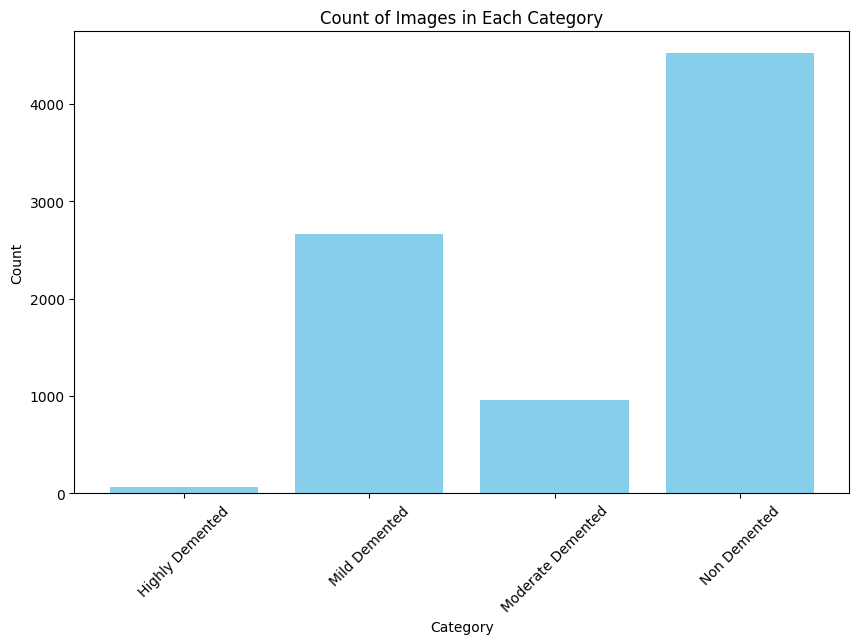

time: 295 ms (started: 2024-04-10 04:48:38 +00:00)


In [ ]:
def plot_class_counts(data_dir):
    # Get class names
    class_names = np.array(sorted([item.name for item in os.scandir(data_dir) if item.is_dir()]))

    # Count the number of images in each class
    class_counts = []
    for class_name in class_names:
        class_counts.append(len(os.listdir(os.path.join(data_dir, class_name))))

    # Plot the count of each category
    plt.figure(figsize=(10, 6))
    plt.bar(class_names, class_counts, color='skyblue')
    plt.xlabel('Category')
    plt.ylabel('Count')
    plt.title('Count of Images in Each Category')
    plt.xticks(rotation=45)
    plt.show()

plot_class_counts(data_dir)

In [ ]:
import os
import shutil

# Define paths
source_path = os.path.join(data_path, "Highly Demented")
destination_path = os.path.join(data_path, "Moderate Demented")
source_dir = pathlib.Path(source_path)
destination_dir = pathlib.Path(destination_path)

# Move files from source to destination
for file_name in os.listdir(source_dir):
    source_file = os.path.join(source_dir, file_name)
    destination_file = os.path.join(destination_dir, file_name)
    shutil.move(source_file, destination_file)

# Delete the 'Highly Demented' folder
shutil.rmtree(source_path)

time: 4.74 ms (started: 2024-04-10 04:53:26 +00:00)


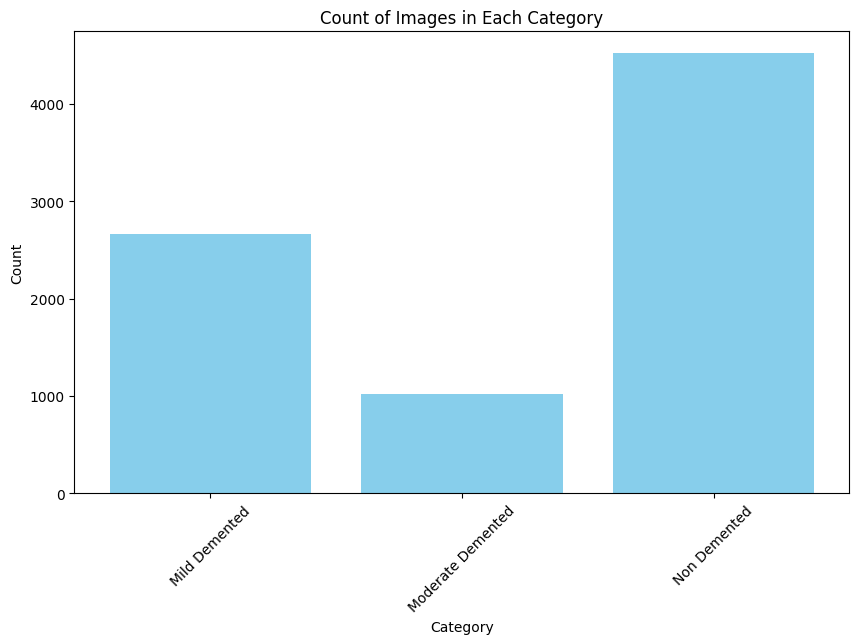

time: 267 ms (started: 2024-04-10 04:53:46 +00:00)


In [ ]:
plot_class_counts(data_dir)

#### Data Augmentation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

categories = ['Mild Demented', 'Moderate Demented', 'Non Demented']
# Define target number of images
target_count = 4000

# Initialize ImageDataGenerator for data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest')

# Iterate over each category
for category in categories:
    category_folder = os.path.join(data_dir, category)
    images = os.listdir(category_folder)
    num_images = len(images)

    # Check if the category needs augmentation
    if num_images < target_count:
        print(f'Augmenting images for {category}...')
        # Calculate the number of additional images needed
        augment_count = target_count - num_images
        print(f'Augmenting {augment_count} images...')
        augment_iter = datagen.flow_from_directory(
            data_dir,
            target_size=(150, 150),
            classes=[category],
            batch_size=1,
            class_mode=None,
            shuffle=True,
            save_to_dir=category_folder,
            save_prefix='aug_',
            save_format='jpg'
        )
        # Generate and save additional images
        for i in range(augment_count):
            augment_batch = next(augment_iter)

Augmenting images for Mild Demented...
Augmenting 1336 images...
Found 2664 images belonging to 1 classes.
Augmenting images for Moderate Demented...
Augmenting 2980 images...
Found 1020 images belonging to 1 classes.
time: 26.1 s (started: 2024-04-10 04:54:16 +00:00)


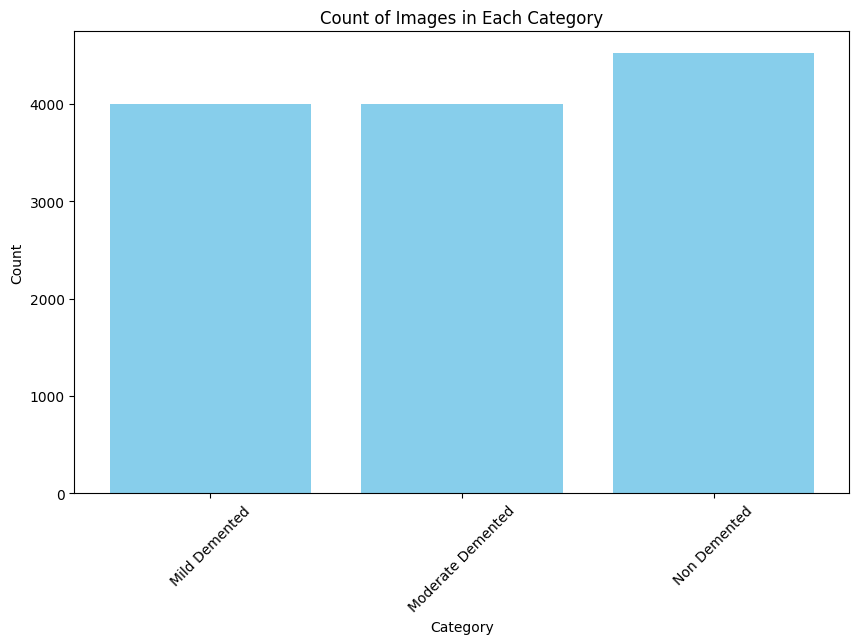

time: 251 ms (started: 2024-04-10 04:54:52 +00:00)


In [ ]:
plot_class_counts(data_dir)

In [ ]:
data = tf.keras.utils.image_dataset_from_directory(data_path,
                                                batch_size = 32,
                                                image_size=(385, 385),
                                                shuffle=True,
                                                seed=42,)
class_names = data.class_names

Found 12518 files belonging to 3 classes.
time: 3.19 s (started: 2024-04-10 04:56:36 +00:00)


In [ ]:
def train_test_val_split(data, train_size, val_size, test_size):
    train = int(len(data) * train_size)
    val = int(len(data) * val_size)
    test = int(len(data) * test_size)

    train_data = data.take(train)
    val_data = data.skip(train).take(val)
    test_data = data.skip(train + val).take(test)

    return train_data, val_data, test_data

train_data, val_data, test_data = train_test_val_split(data, train_size=0.8, val_size=0.1, test_size=0.1)

time: 13.5 ms (started: 2024-04-10 04:56:49 +00:00)


In [ ]:
def normalize_images(images, labels):
    images = tf.cast(images, tf.float32) / 255.0
    return images, labels

time: 739 µs (started: 2024-04-10 04:56:54 +00:00)


In [ ]:
# Apply normalization to datasets
train_data = train_data.map(normalize_images)
val_data = val_data.map(normalize_images)
test_data = test_data.map(normalize_images)

# Prefetch and cache the datasets for better performance
train_data = train_data.prefetch(tf.data.experimental.AUTOTUNE)
val_data = val_data.prefetch(tf.data.experimental.AUTOTUNE)
test_data = test_data.prefetch(tf.data.experimental.AUTOTUNE)

time: 74.4 ms (started: 2024-04-10 04:57:02 +00:00)


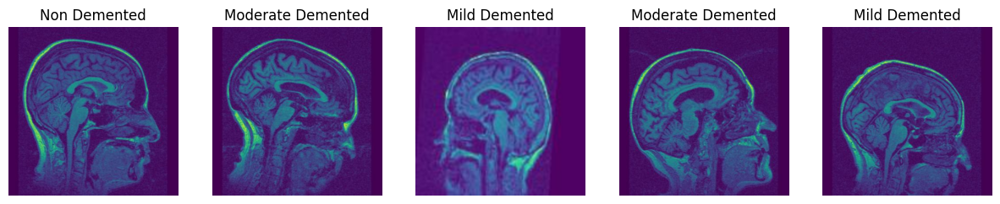

time: 976 ms (started: 2024-04-10 05:00:29 +00:00)


In [ ]:
def plot_sample_images(data, class_names):
    for images, labels in train_data.take(1):
        sample_images = images[:5]
        sample_labels = labels[:5]

    # Plot the images with their categories
    plt.figure(figsize=(15, 10))
    for i in range(5):
        plt.subplot(1, 5, i + 1)
        plt.imshow(sample_images[i])
        plt.title(class_names[sample_labels[i]])
        plt.axis("off")
    plt.show()
plot_sample_images(train_data, class_names)

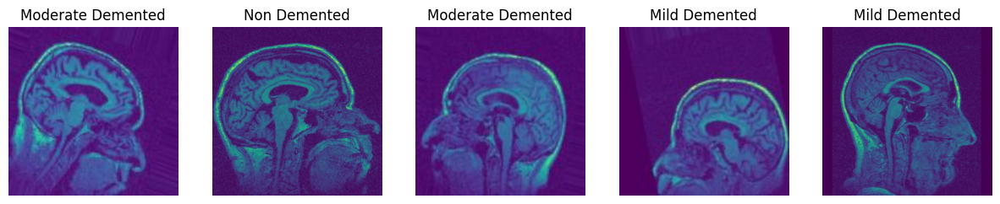

time: 949 ms (started: 2024-04-10 05:00:44 +00:00)


In [ ]:
plot_sample_images(test_data, class_names)

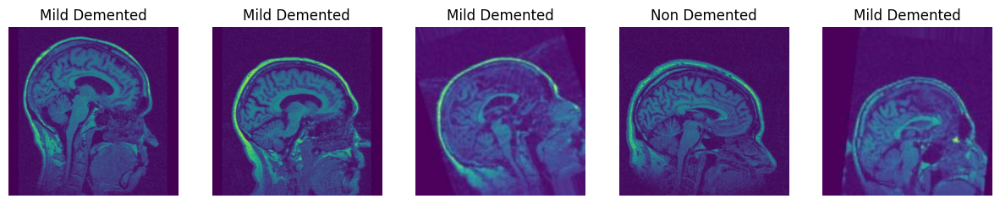

time: 907 ms (started: 2024-04-10 05:00:56 +00:00)


In [ ]:
plot_sample_images(val_data, class_names)

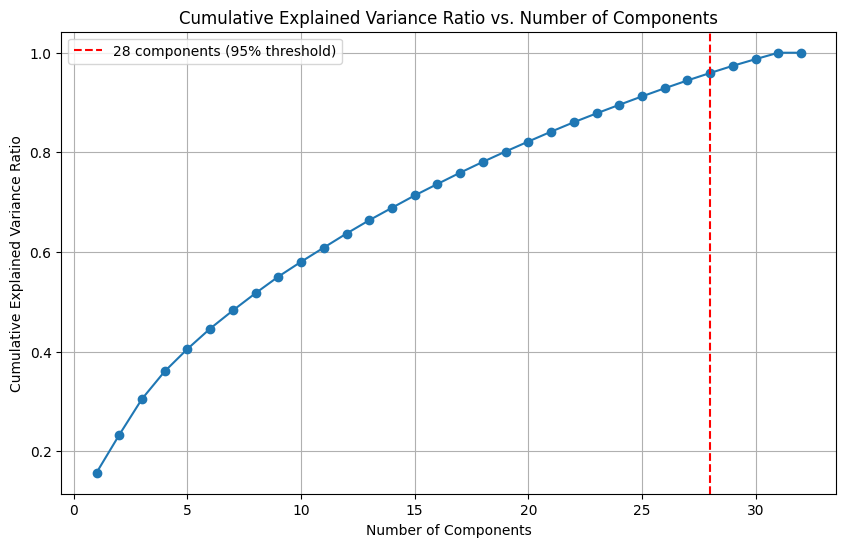

time: 7.19 s (started: 2024-04-10 05:01:08 +00:00)


In [ ]:
from sklearn.decomposition import PCA
for images, _ in train_data.take(100):
    X = images.numpy().reshape(images.shape[0], -1)

# Fit PCA
pca = PCA()
pca.fit(X)

# Calculate cumulative explained variance ratio
cumulative_explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components that retains a significant amount of variance (95% threshold)
n_components = np.argmax(cumulative_explained_variance_ratio >= 0.95) + 1

# Plot the cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance_ratio) + 1), cumulative_explained_variance_ratio, marker='o', linestyle='-')
plt.axvline(x=n_components, color='red', linestyle='--', label=f'{n_components} components (95% threshold)')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Components')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D,Input

time: 638 µs (started: 2024-04-10 05:07:13 +00:00)


#### Modelling

In [ ]:
input_shape = (385, 385, 3)
first_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

first_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
first_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 383, 383, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 191, 191, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 189, 189, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 94, 94, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 565504)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │    18,096,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,115,651 (69.11 MB)

 Trainable params: 18,115,651 (69.11 MB)

 Non-trainable params: 0 (0.00 B)

time: 64.4 ms (started: 2024-04-10 05:12:33 +00:00)


In [ ]:
first_history = first_model.fit(train_data, epochs=20, validation_data=val_data)

Epoch 1/20
  1/313 ━━━━━━━━━━━━━━━━━━━━ 1:56:29 22s/step - accuracy: 0.3438 - loss: 1.1030

W0000 00:00:1712726002.227437     158 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 0.4630 - loss: 1.6449

W0000 00:00:1712726045.979475     158 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


313/313 ━━━━━━━━━━━━━━━━━━━━ 68s 145ms/step - accuracy: 0.4634 - loss: 1.6427 - val_accuracy: 0.8429 - val_loss: 0.3859
Epoch 2/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - accuracy: 0.7746 - loss: 0.5077 - val_accuracy: 0.8790 - val_loss: 0.2830
Epoch 3/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - accuracy: 0.8436 - loss: 0.3509 - val_accuracy: 0.8814 - val_loss: 0.2676
Epoch 4/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - accuracy: 0.8629 - loss: 0.3005 - val_accuracy: 0.8998 - val_loss: 0.2285
Epoch 5/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - accuracy: 0.8783 - loss: 0.2688 - val_accuracy: 0.9022 - val_loss: 0.2079
Epoch 6/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - accuracy: 0.8853 - loss: 0.2465 - val_accuracy: 0.8982 - val_loss: 0.2425
Epoch 7/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 53s 170ms/step - accuracy: 0.8943 - loss: 0.2328 - val_accuracy: 0.8918 - val_loss: 0.2818
Epoch 8/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 45s 143ms/step - accuracy: 0.8987 - loss: 0.2120 - val

In [ ]:
def plot_history(history):
    # Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

time: 1.06 ms (started: 2024-04-10 05:27:59 +00:00)


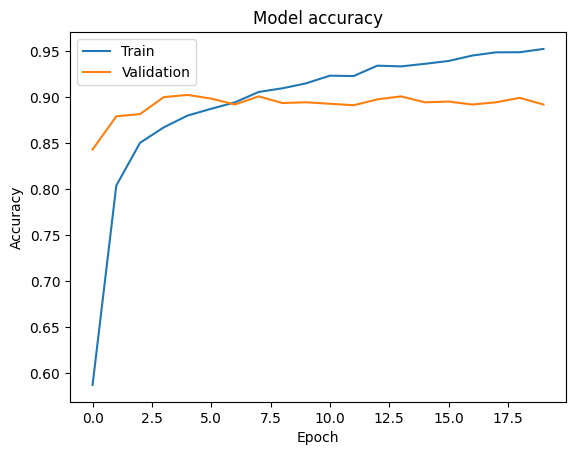

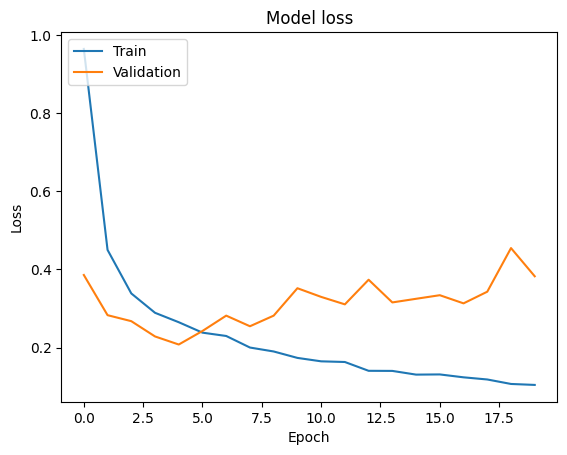

time: 568 ms (started: 2024-04-10 05:27:59 +00:00)


In [ ]:
plot_history(first_history)

In [ ]:
first_model.evaluate(test_data)

39/39 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - accuracy: 0.8781 - loss: 0.4196


[0.3764576315879822, 0.8854166865348816]

time: 10.2 s (started: 2024-04-10 05:50:36 +00:00)


In [ ]:

def cnn_model(input_shape):
    model = Sequential()

    model.add(Conv2D(filters=16, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal',
                     input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dense(128, activation="relu", kernel_initializer='he_normal'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(4, activation="softmax"))

    model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=['accuracy'])

    model.summary()

    return model

# Input shape should match your data shape (e.g., (385, 385, 3))
input_shape = (385, 385, 3)

# Build the simple CNN model
model = cnn_model(input_shape)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 383, 383, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 191, 191, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 189, 189, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 94, 94, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 92, 92, 128)    │        36,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 46, 46, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 270848)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │    34,668,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,719,268 (132.44 MB)

 Trainable params: 34,719,268 (132.44 MB)

 Non-trainable params: 0 (0.00 B)

time: 144 ms (started: 2024-04-10 05:28:46 +00:00)


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

def checkpoint_callback():
    checkpoint_filepath = '/temp/cp.keras'
    model_checkpoint_callback = ModelCheckpoint(filepath=checkpoint_filepath,
                                                 save_weights_only=False,
                                                 save_best_only=True,
                                                 monitor='val_accuracy',
                                                 verbose=1)
    return model_checkpoint_callback

def early_stopping(patience):
    es_callback = EarlyStopping(monitor='val_loss', patience=patience, verbose=1)
    return es_callback

EPOCHS = 70
checkpoint_callback = checkpoint_callback()
early_stopping = early_stopping(patience=20)
callbacks = [checkpoint_callback, early_stopping]

time: 1.15 ms (started: 2024-04-10 05:30:43 +00:00)


In [ ]:
cnn_history = model.fit(train_data, epochs=EPOCHS, validation_data=val_data, callbacks=callbacks)

Epoch 1/70
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.3918 - loss: 2.9313
Epoch 1: val_accuracy improved from -inf to 0.64583, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 68s 161ms/step - accuracy: 0.3921 - loss: 2.9266 - val_accuracy: 0.6458 - val_loss: 0.7380
Epoch 2/70
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.6484 - loss: 0.7510
Epoch 2: val_accuracy improved from 0.64583 to 0.86058, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.6485 - loss: 0.7508 - val_accuracy: 0.8606 - val_loss: 0.3753
Epoch 3/70
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.7673 - loss: 0.4933
Epoch 3: val_accuracy improved from 0.86058 to 0.88221, saving model to /temp/cp.keras
313/313 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.7674 - loss: 0.4931 - val_accuracy: 0.8822 - val_loss: 0.2751
Epoch 4/70
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.8235 - loss: 0.3837
Epoch 4: val_accuracy improved fro

#### Analysis

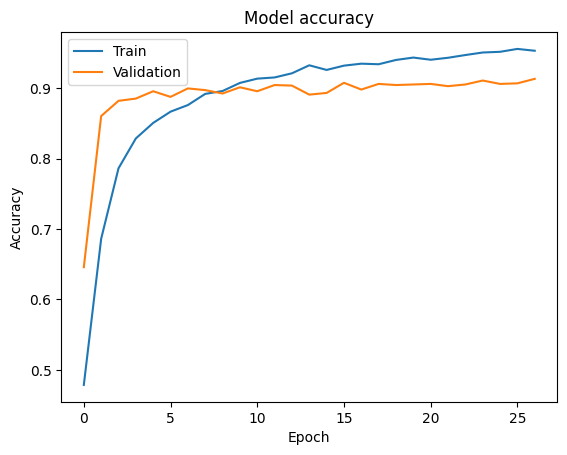

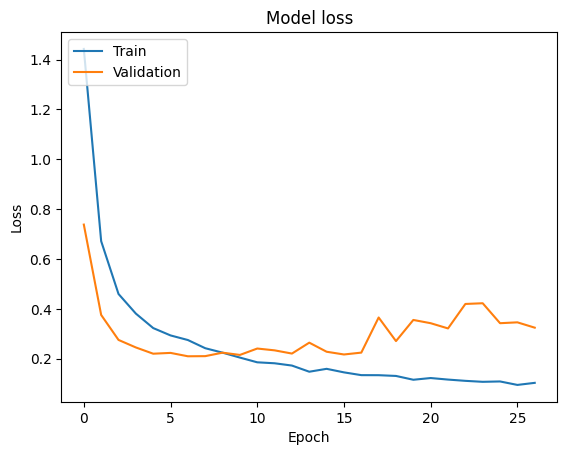

time: 476 ms (started: 2024-04-10 05:50:36 +00:00)


In [ ]:
plot_history(cnn_history)

In [ ]:
model.evaluate(test_data)

39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - accuracy: 0.8982 - loss: 0.3389


[0.3720785677433014, 0.8902243375778198]

time: 13.1 s (started: 2024-04-10 05:51:46 +00:00)


Classification Report:
                   precision    recall  f1-score   support

    Mild Demented       0.85      0.75      0.80       375
Moderate Demented       0.80      0.89      0.84       426
     Non Demented       1.00      1.00      1.00       447

         accuracy                           0.89      1248
        macro avg       0.89      0.88      0.88      1248
     weighted avg       0.89      0.89      0.89      1248



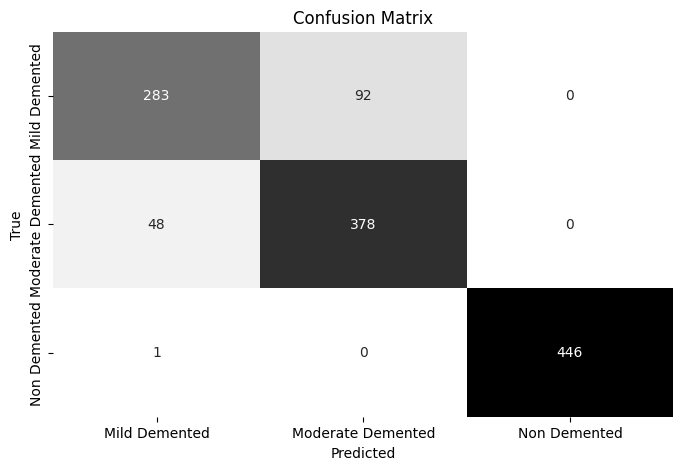

time: 22.7 s (started: 2024-04-10 05:58:01 +00:00)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
def report(model, test_data, class_names):
    # Generate predictions
    predictions = []
    labels = []
    for X, y in test_data.as_numpy_iterator():
        y_pred = model.predict(X, verbose=0)
        y_prediction = np.argmax(y_pred, axis=1)
        predictions.extend(y_prediction)
        labels.extend(y)

    predictions = np.array(predictions)
    labels = np.array(labels)

    # Generate classification report
    print("Classification Report:")
    print(classification_report(labels, predictions, target_names=class_names))

    # Generate confusion matrix
    cm = confusion_matrix(labels, predictions)
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

    # Plot confusion matrix
    plt.figure(figsize=(8, 5))
    sns.heatmap(cm_df, annot=True, fmt="d", cmap="Greys", cbar=False)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

report(model, test_data, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


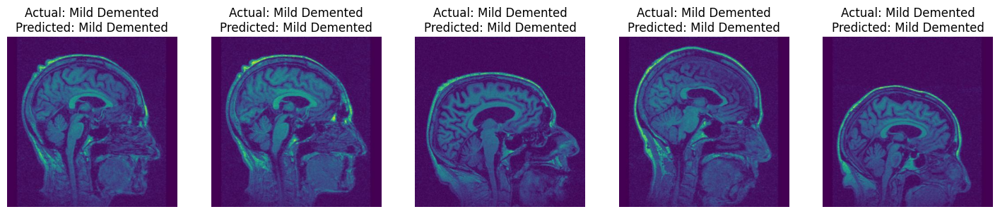

time: 12.4 s (started: 2024-04-10 05:59:19 +00:00)


In [ ]:
def plot_predictions(test_data, model, class_names):
    plt.figure(figsize=(18, 15))
    count = 0
    for images, labels in test_data.take(1):
        # Denormalize images
        images = images * 255.0

        predictions = model.predict(images)
        predicted_labels = np.argmax(predictions, axis=1)
        # Filter images and labels for 'Mild Demented' category
        mild_demented_mask = labels.numpy() == class_names.index('Mild Demented')
        images_mild_demented = images.numpy()[mild_demented_mask]
        labels_mild_demented = labels.numpy()[mild_demented_mask]
        predicted_labels_mild_demented = predicted_labels[mild_demented_mask]
        # Plot images
        for i in range(len(images_mild_demented)):
            if count < 5:
                plt.subplot(1, 5, count + 1)
                plt.imshow(images_mild_demented[i].astype("uint8"))
                plt.title(f'Actual: {class_names[labels_mild_demented[i]]}\nPredicted: {class_names[predicted_labels_mild_demented[i]]}')
                plt.axis('off')
                count += 1
            else:
                break

# Plot images with predicted labels for 'Mild Demented' category
plot_predictions(test_data, model, class_names)
plt.show()

#### VGG 16  (2hrs + Runtime)

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_vgg16_model(input_shape, num_classes):
    # Load the pre-trained VGG16 model without the top (classification) layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom top layers for classification
    x = Flatten()(base_model.output)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.125)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.125)(x)
    output = Dense(num_classes, activation='softmax')(x)

    # Create the final model
    model = Model(inputs=base_model.input, outputs=output)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model

# Define the input shape and number of classes
input_shape = (385, 385, 3)
num_classes = 4

# Build the VGG16 model with fine-tuning
vgg16_model = build_vgg16_model(input_shape, num_classes)

# Print model summary
vgg16_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 385, 385, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 385, 385, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 385, 385, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 192, 192, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 192, 192, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 192, 192, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 96, 96, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 96, 96, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 96, 96, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 96, 96, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 48, 48, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 48, 48, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 48, 48, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 48, 48, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 24, 24, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 24, 24, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 24, 24, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 24, 24, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 12, 12, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 73728)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │     9,437,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │           26

 Total params: 24,160,516 (92.17 MB)

 Trainable params: 9,445,828 (36.03 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

time: 778 ms (started: 2024-04-10 06:00:32 +00:00)


In [ ]:
history = vgg16_model.fit(
    train_data,
    epochs=50,
    validation_data=val_data,
    callbacks=callbacks)

Epoch 1/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.5341 - loss: 0.9629
Epoch 1: val_accuracy did not improve from 0.91346
313/313 ━━━━━━━━━━━━━━━━━━━━ 245s 481ms/step - accuracy: 0.5343 - loss: 0.9626 - val_accuracy: 0.6979 - val_loss: 0.6375
Epoch 2/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step - accuracy: 0.7213 - loss: 0.6277
Epoch 2: val_accuracy did not improve from 0.91346
313/313 ━━━━━━━━━━━━━━━━━━━━ 154s 491ms/step - accuracy: 0.7214 - loss: 0.6275 - val_accuracy: 0.8381 - val_loss: 0.4255
Epoch 3/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step - accuracy: 0.8258 - loss: 0.4361
Epoch 3: val_accuracy did not improve from 0.91346
313/313 ━━━━━━━━━━━━━━━━━━━━ 154s 491ms/step - accuracy: 0.8259 - loss: 0.4360 - val_accuracy: 0.8782 - val_loss: 0.3050
Epoch 4/50
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step - accuracy: 0.8779 - loss: 0.3235
Epoch 4: val_accuracy did not improve from 0.91346
313/313 ━━━━━━━━━━━━━━━━━━━━ 150s 479ms/step - accuracy: 0.8779 - loss: 0.3234 - 

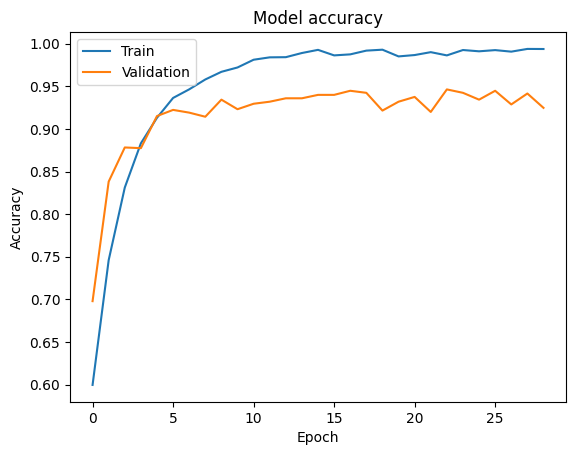

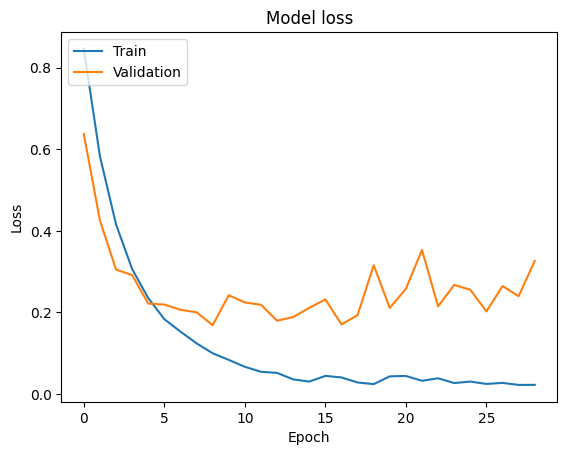

time: 528 ms (started: 2024-04-10 07:18:09 +00:00)


In [ ]:
plot_history(history)

In [ ]:
vgg16_model.evaluate(test_data)

39/39 ━━━━━━━━━━━━━━━━━━━━ 27s 410ms/step - accuracy: 0.9139 - loss: 0.3611


[0.33911117911338806, 0.9158653616905212]

time: 27.4 s (started: 2024-04-10 07:18:09 +00:00)


Classification Report:
                   precision    recall  f1-score   support

    Mild Demented       0.97      0.75      0.84       374
Moderate Demented       0.85      0.97      0.91       438
     Non Demented       0.95      1.00      0.97       436

         accuracy                           0.91      1248
        macro avg       0.92      0.91      0.91      1248
     weighted avg       0.92      0.91      0.91      1248



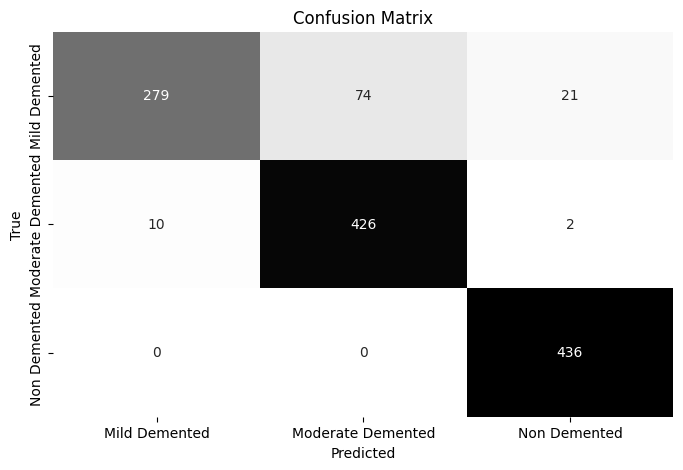

time: 36.8 s (started: 2024-04-10 07:18:37 +00:00)


In [ ]:
report(vgg16_model, test_data, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


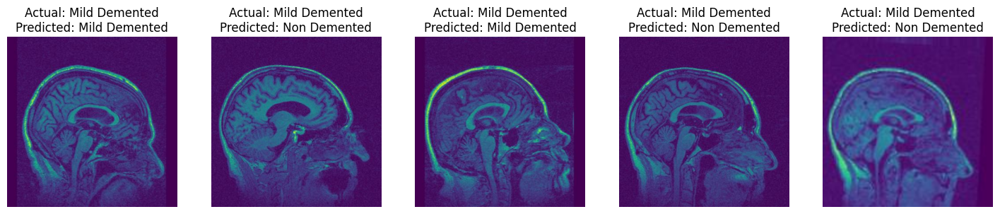

time: 8.53 s (started: 2024-04-10 07:42:33 +00:00)


In [ ]:
plot_predictions(test_data, vgg16_model, class_names)
plt.show()